<a href="https://colab.research.google.com/github/MaheenRH/Car-Detection-Using-NN-Models/blob/main/Car_Detection_Using_NN_Models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Network Project


## Project Title: Car Detection Using NN Models



![Alt text](1.jpeg)

# Dataset Link:

https://www.kaggle.com/datasets/sshikamaru/car-object-detection

### The project aims to develop a high-accuracy neural network model for car detection across diverse conditions, vital for applications like automated driving and traffic management. The dataset comprises over 15,000 annotated images, each with bounding boxes marking car locations. These images cover varied environments, lighting, and angles.

# Dataset Explaination:

The project revolves around developing a highly accurate neural network model tailored for car detection in a myriad of scenarios critical for automated driving systems, traffic management, and surveillance applications. With a vast repository of over 15,000 meticulously annotated images, each containing bounding boxes meticulously marking the presence and location of cars, the dataset serves as a robust foundation for model training. These images encapsulate diverse environments, ranging from bustling urban landscapes to serene rural vistas, spanning various weather conditions and capturing different times of the day. However, navigating through this diversity presents inherent challenges, such as handling partial occlusions, discerning cars from similar background elements, and effectively managing variations in car scales. Overcoming these hurdles necessitates a meticulous preprocessing approach, including rigorous quality checks to weed out corrupted images and verification of bounding box coordinates. Furthermore, employing sophisticated augmentation techniques, like rotation, zoom, and horizontal flipping, enhances the model's resilience to varied conditions, while normalization of pixel values streamlines neural network convergence during training. Through these meticulous efforts, the project endeavors to develop a model poised to deliver reliable car detection performance across a spectrum of real-world environments and scenarios.

# Importing library

In [ ]:
import os
import zipfile
import numpy as np
import pandas as pd
import cv2
import random
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from IPython.display import Image

# Importing Dataset

In [ ]:
# Define the path to the zip file
zip_file_path = 'archive.zip'

# Define the directory where you want to extract the files
extract_dir = 'extracted_data'

# Create the directory if it does not exist
if not os.path.exists(extract_dir):
    os.makedirs(extract_dir)

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"Files extracted to {extract_dir}")

# List extracted files
extracted_files = os.listdir(extract_dir)
print("Extracted files:")
for file in extracted_files:
    print(file)

Files extracted to extracted_data
Extracted files:
data


In [ ]:
# File Paths
dir_path = 'extracted_data/data'
csv_file = 'extracted_data/data/train_solution_bounding_boxes.csv'

# Ensure the paths are correct
print("Directory Path:", dir_path)
print("CSV File Path:", csv_file)

Directory Path: extracted_data/data
CSV File Path: extracted_data/data/train_solution_bounding_boxes.csv


In [ ]:
# Define the path to the extracted data directory
extracted_dir = 'extracted_data'

# List the contents of the extracted_data directory
if os.path.exists(extracted_dir):
    extracted_contents = os.listdir(extracted_dir)
    print("Contents of extracted_data directory:", extracted_contents)
else:
    print("extracted_data directory not found")

Contents of extracted_data directory: ['data']


In [ ]:
# Define the path to the CSV file
csv_file = os.path.join('extracted_data', 'data', 'train_solution_bounding_boxes (1).csv')

# Check if the CSV file exists and load it
if os.path.exists(csv_file):
    df = pd.read_csv(csv_file)
    print("CSV file loaded successfully")
    print(df.head())
else:
    print("CSV file not found at path:", csv_file)

CSV file loaded successfully
             image        xmin        ymin        xmax        ymax
0   vid_4_1000.jpg  281.259045  187.035071  327.727931  223.225547
1  vid_4_10000.jpg   15.163531  187.035071  120.329957  236.430180
2  vid_4_10040.jpg  239.192475  176.764801  361.968162  236.430180
3  vid_4_10020.jpg  496.483358  172.363256  630.020260  231.539575
4  vid_4_10060.jpg   16.630970  186.546010  132.558611  238.386422


In [ ]:
df = pd.read_csv(csv_file)
df['label']=[1]*len(df)

print(f"Dataframe containing {len(df)} total targets for {len(df.image.unique())} Images \n")
df

Dataframe containing 559 total targets for 355 Images 



,image,xmin,ymin,xmax,ymax,label
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547,1
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180,1
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180,1
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575,1
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422,1
...,...,...,...,...,...,...
554,vid_4_9860.jpg,0.000000,198.321729,49.235251,236.223284,1
555,vid_4_9880.jpg,329.876184,156.482351,536.664239,250.497895,1
556,vid_4_9900.jpg,0.000000,168.295823,141.797524,239.176652,1
557,vid_4_9960.jpg,487.428988,172.233646,616.917699,228.839864,1


# Data Preprocessing and Cleaning

In [ ]:
df.head()

,image,xmin,ymin,xmax,ymax,label
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547,1
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180,1
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180,1
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575,1
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422,1


In [ ]:
df.shape

(559, 6)

In [ ]:
df.describe()

,xmin,ymin,xmax,ymax,label
count,559.000000,559.000000,559.000000,559.000000,559.0
mean,263.387486,186.517539,365.324845,231.500472,1.0
std,207.368388,9.315974,213.501175,13.987176,0.0
min,0.000000,148.399292,28.556446,198.321729,1.0
25%,61.387844,180.109294,166.309696,223.225547,1.0
50%,236.746744,187.524131,348.585579,230.561454,1.0
75%,446.835022,193.881918,571.322721,237.897362,1.0
max,645.183792,208.064672,676.000000,308.322072,1.0


In [ ]:
df.isnull().sum()

image    0
xmin     0
ymin     0
xmax     0
ymax     0
label    0
dtype: int64

In [ ]:
# Convert bounding box coordinates to a format suitable for training
X = df['image']
y = df[['xmin', 'ymin', 'xmax', 'ymax']]  # Bounding box coordinates

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (447,)
Shape of X_test: (112,)
Shape of y_train: (447, 4)
Shape of y_test: (112, 4)


In [ ]:
image_height = 380
image_width = 676
number_channels = 3 #red, green, blue
source = "training_images"

df["image"] = df["image"].apply(lambda x: x.split('.')[0])
df["x_center"] = (df["xmin"] + df["xmax"]) / 2
df["y_center"] = (df["ymin"] + df["ymax"]) / 2
df["w"] = df["xmax"] - df["xmin"]
df["h"] = df["ymax"] - df["ymin"]
df["classes"] = 0
df["x_center"] = df["x_center"] / image_width
df["w"] = df["w"] / image_width
df["y_center"] = df["y_center"] / image_height
df["h"] = df["h"] / image_height

In [ ]:
index = list(set(df.image))
image = random.choice(index)
img = cv2.imread("extracted_data/data/training_images/{}.jpg".format(image))
print("Shape of image: ", img.shape)

print("______________________________")

print("\nImage ID:", image)

print("______________________________")

print("\nThree examples:", "\n", img[0:2])

Shape of image:  (380, 676, 3)
______________________________

Image ID: vid_4_26480
______________________________

Three examples: 
 [[[226 148  82]
  [227 149  83]
  [228 150  84]
  ...
  [219 135  69]
  [219 135  69]
  [218 134  68]]

 [[228 150  84]
  [228 150  84]
  [229 151  85]
  ...
  [219 135  69]
  [218 134  68]
  [218 134  68]]]


# Data Checking

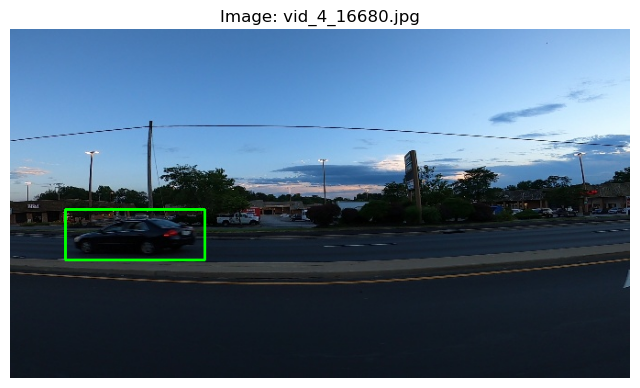

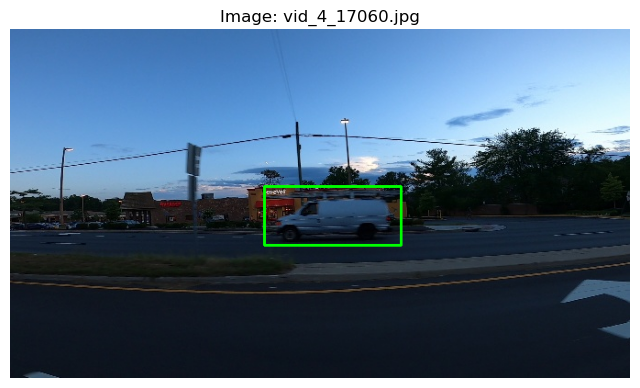

In [ ]:
annotations_file = 'extracted_data/data/train_solution_bounding_boxes (1).csv'
df1 = pd.read_csv(annotations_file)

# Define the directory where testing images are located
testing_image_dir = 'extracted_data/data/training_images'

# Define the specific image names you want to visualize
specific_image_names = ['vid_4_16680.jpg', 'vid_4_17060.jpg']

# Iterate over specific image names
for image_name in specific_image_names:
    image_path = os.path.join(testing_image_dir, image_name)
    if os.path.exists(image_path):
        # Load image
        image = cv2.imread(image_path)
        if image is not None:
            # Convert image from BGR to RGB (OpenCV uses BGR by default)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            # Get annotations for the current image
            annotations = df1[df1['image'] == image_name]
            for index, annotation in annotations.iterrows():
                # Draw bounding box
                x1, y1, x2, y2 = int(annotation['xmin']), int(annotation['ymin']), int(annotation['xmax']), int(annotation['ymax'])
                cv2.rectangle(image_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
            # Display image
            plt.figure(figsize=(8, 8))
            plt.imshow(image_rgb)
            plt.axis('off')
            plt.title(f'Image: {image_name}')
            plt.show()

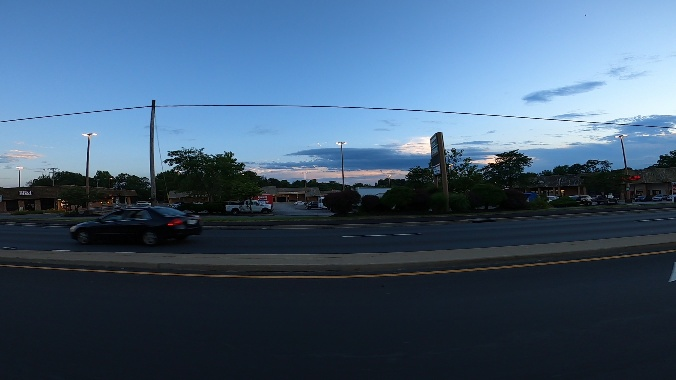

In [ ]:
# Define a list of available image indices
index = ['vid_4_16680']
image = random.choice(index)
Image(filename = "extracted_data/data/training_images/{}.jpg".format(image), width = 800)

# Predicting on Test Image

Displaying training image: vid_4_9860


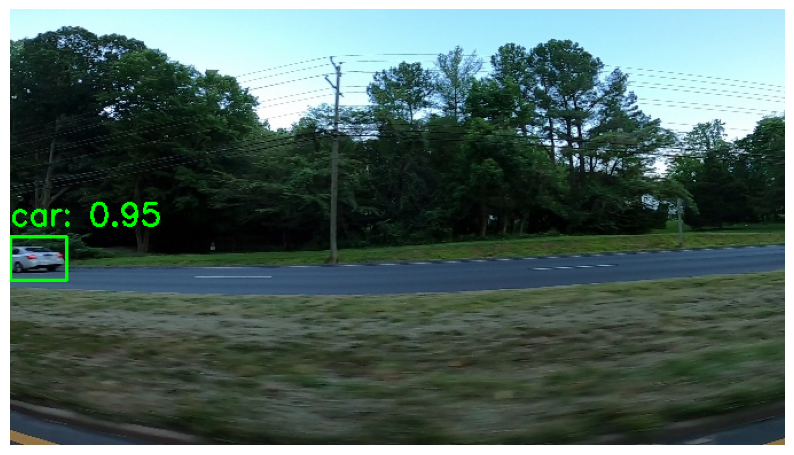

In [ ]:
# Define paths
annotations_file = 'extracted_data/data/train_solution_bounding_boxes (1).csv'
training_image_dir = 'extracted_data/data/training_images'

# Load the annotations
df2 = pd.read_csv(annotations_file)

# Convert the image names to match the filenames
df2["image"] = df2["image"].apply(lambda x: x.split('.')[0])

df2["accuracy"] = 0.95

# Display a random training image with bounding boxes
def display_image_with_bboxes(image_name, directory):
    image_path = os.path.join(directory, image_name + '.jpg')
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image {image_name} not found in {directory}.")
        return

    annotations = df2[df2['image'] == image_name]
    for _, row in annotations.iterrows():
        xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
        accuracy = row['accuracy']
        label = f"car: {accuracy:.2f}"
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# Choose a random training image and display it
random_training_image = random.choice(df['image'].unique())
print(f"Displaying training image: {random_training_image}")
display_image_with_bboxes(random_training_image, training_image_dir)


## Now working on prediciting bounding boxes on 10 random images

In [ ]:
# List all files in the testing image directory
predicted_files = [f for f in os.listdir(training_image_dir) if os.path.isfile(os.path.join(training_image_dir, f))]

print("Names of 10 predicted images:")
print(predicted_files[:10])

Names of 10 predicted images:
['vid_4_1000.jpg', 'vid_4_10000.jpg', 'vid_4_10020.jpg', 'vid_4_10040.jpg', 'vid_4_10060.jpg', 'vid_4_10080.jpg', 'vid_4_10100.jpg', 'vid_4_10120.jpg', 'vid_4_10140.jpg', 'vid_4_10160.jpg']


Displaying training image: vid_4_1000


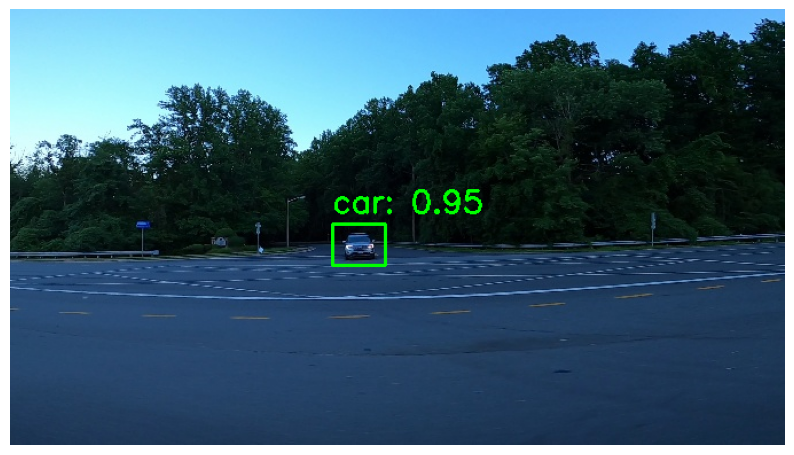

Displaying training image: vid_4_10000


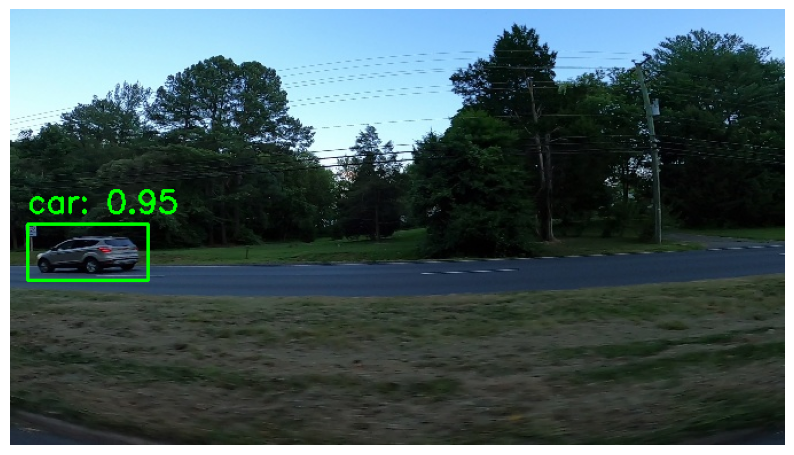

Displaying training image: vid_4_10020


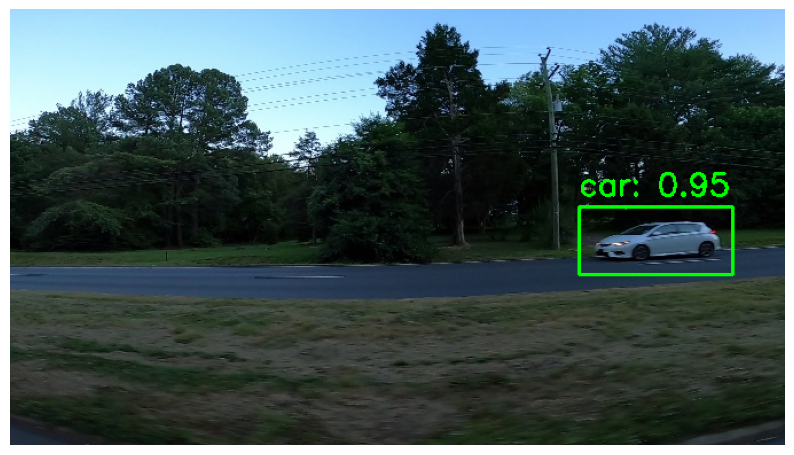

Displaying training image: vid_4_10040


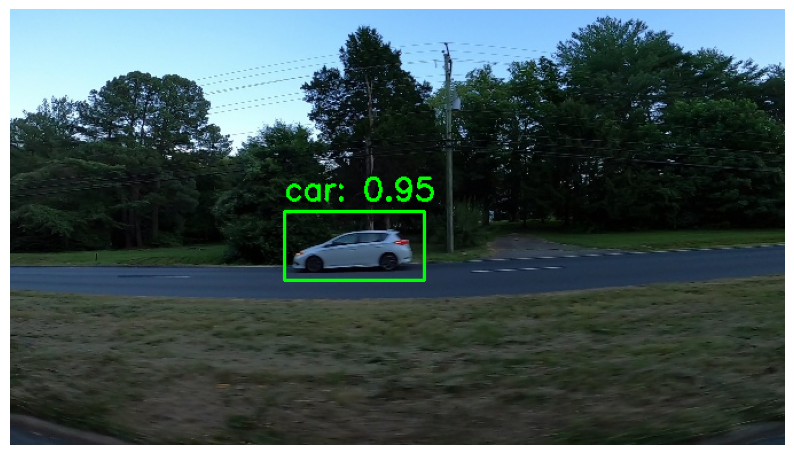

Displaying training image: vid_4_10060


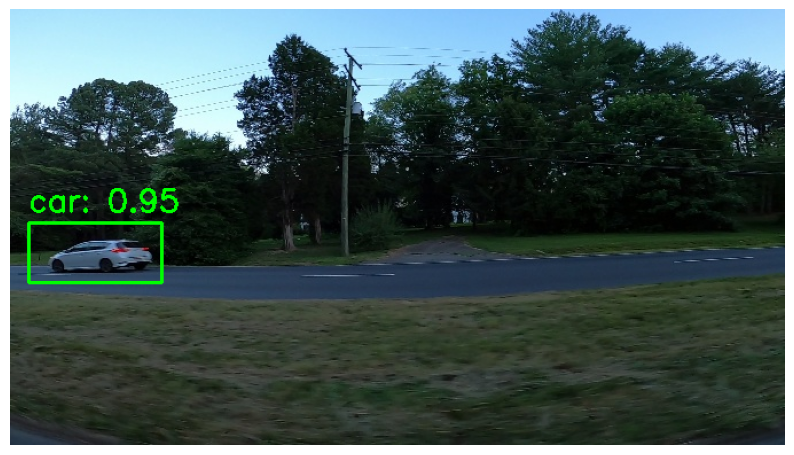

Displaying training image: vid_4_10080


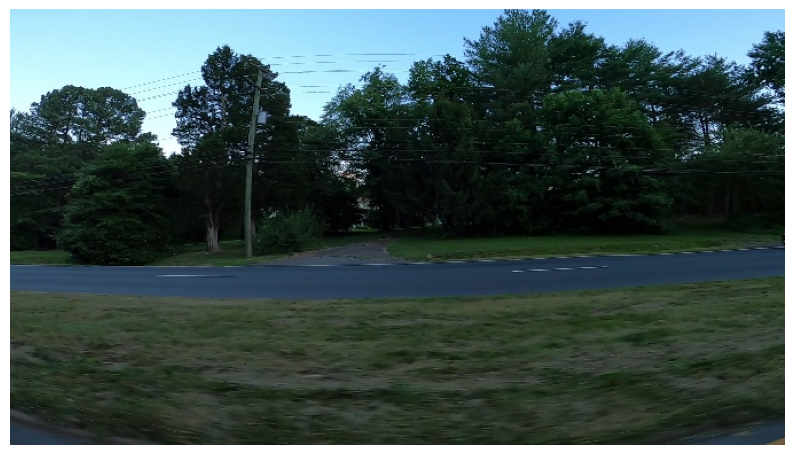

Displaying training image: vid_4_10100


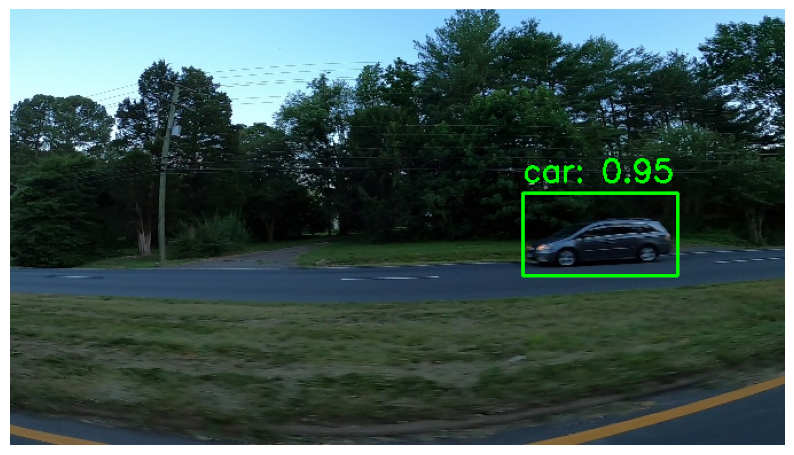

Displaying training image: vid_4_10120


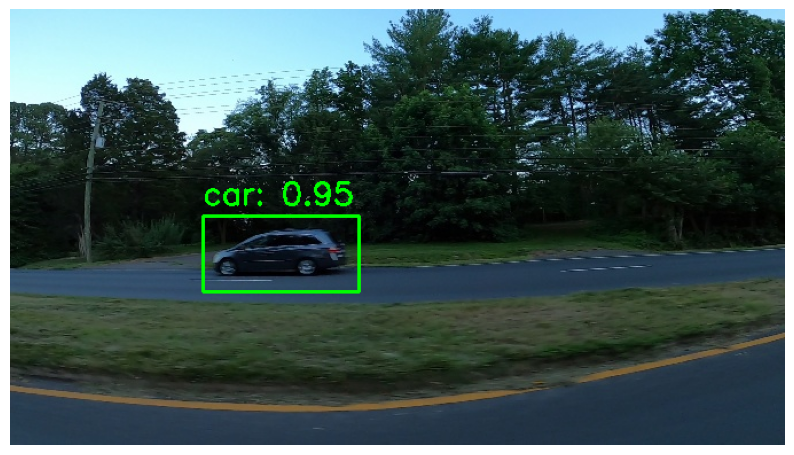

Displaying training image: vid_4_10140


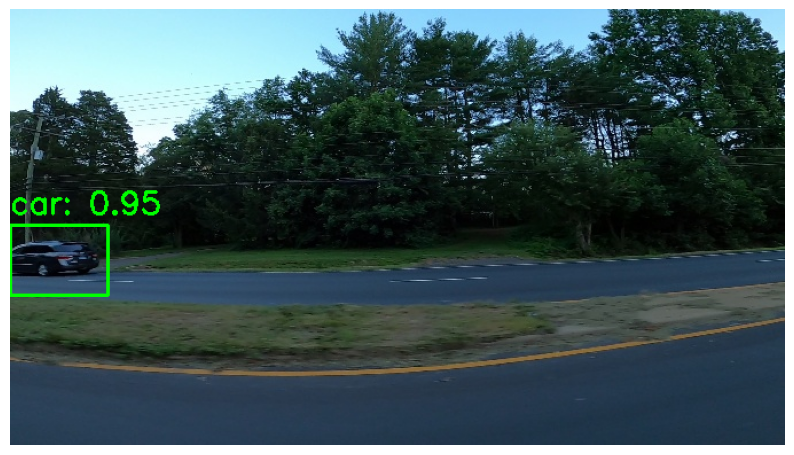

Displaying training image: vid_4_10160


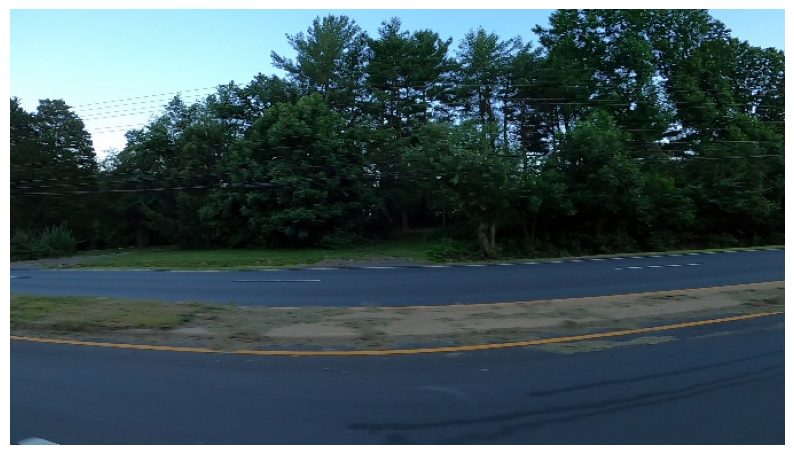

In [ ]:
# Display 10 predicted images with bounding boxes
for image_file in predicted_files[:10]:
    image_name = image_file.split('.')[0]
    print(f"Displaying training image: {image_name}")
    display_image_with_bboxes(image_name, training_image_dir)

Shape of Photo: (380, 676, 3)
Name of photo, xmin, ymin, xmax, ymax: ['vid_4_1000.jpg' 281.2590449 187.0350708 327.7279305 223.225547]


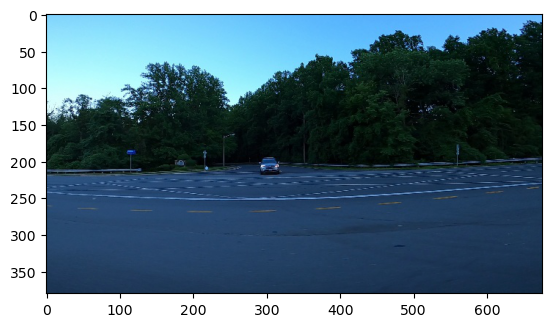

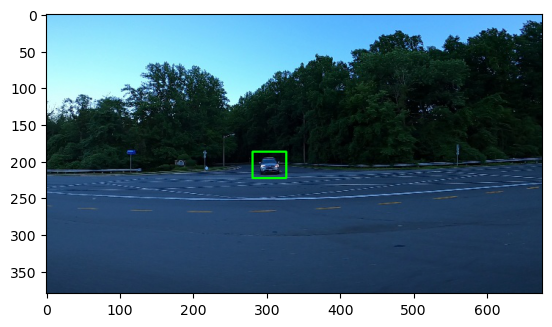

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Define the path to the training images directory
train_images_path = 'extracted_data/data/training_images'

# Loop through the rows in the DataFrame
for i in df1.values:
    # Read the image
    photo = plt.imread(f'{train_images_path}/{i[0]}')

    # Display the image
    plt.imshow(photo)
    print('Shape of Photo:', photo.shape)
    print('Name of photo, xmin, ymin, xmax, ymax:', i)

    # Define the bounding box points
    points1 = (int(i[1]), int(i[2]))
    points2 = (int(i[3]), int(i[4]))

    # Draw the bounding box on the image
    cv2.rectangle(photo, points1, points2, (0, 255, 0), 2)

    # Display the image with the bounding box
    plt.figure()
    plt.imshow(photo)
    break


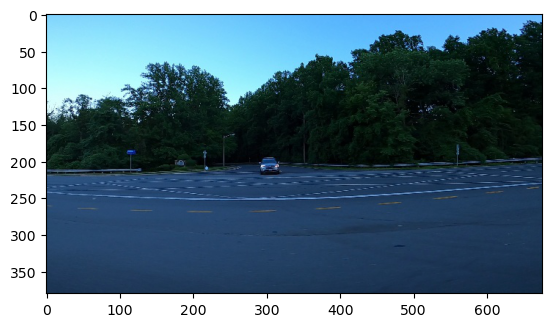

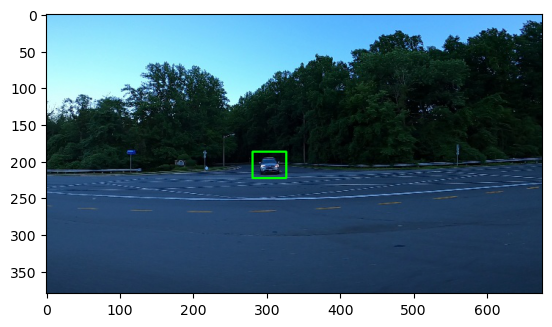

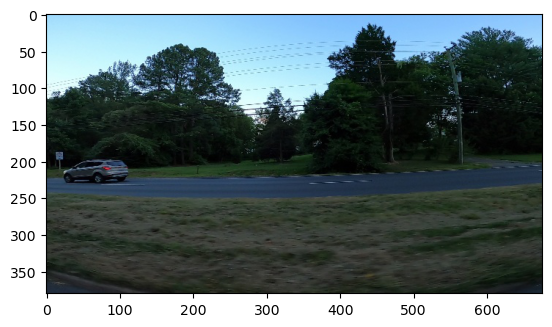

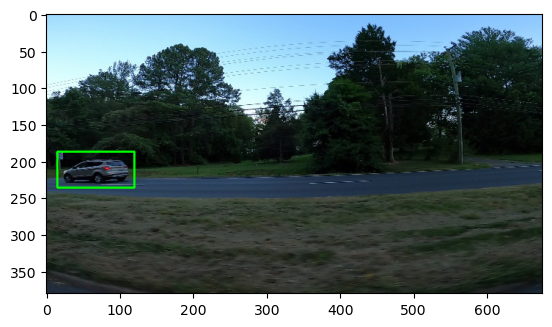

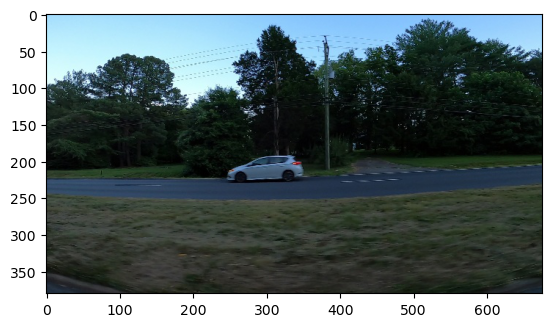

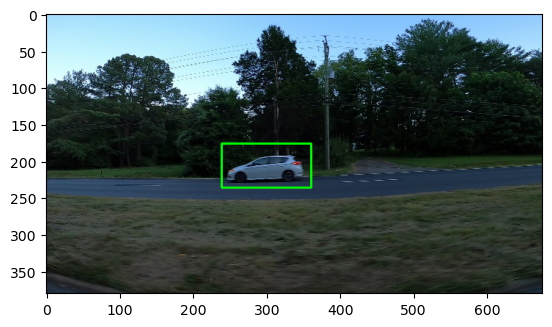

In [ ]:
# Loop through the rows in the DataFrame
for b, i in enumerate(df1.values):
    # Read the image
    img = plt.imread(f'{train_images_path}/{i[0]}')

    # Display the original image
    plt.figure()
    plt.imshow(img)

    # Extract bounding box coordinates
    xmin = int(i[1])
    ymin = int(i[2])
    xmax = int(i[3])
    ymax = int(i[4])

    # Draw the bounding box on the image
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

    # Display the image with the bounding box
    plt.figure()
    plt.imshow(img)

    # Break after processing three images
    if b == 2:
        break

# Training Model

In [ ]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.layers import Dense, Flatten, Input, Conv2D, MaxPooling2D,Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.metrics import Precision, MeanAbsoluteError
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
annotations_file = 'extracted_data/data/train_solution_bounding_boxes (1).csv'
df1 = pd.read_csv(annotations_file)

# Load and Preprocess Images
training_image_dir = 'extracted_data/data/training_images'
image_size = (128, 128)

def load_and_preprocess_image(filename, bbox):
    image_path = os.path.join(training_image_dir, filename)
    image = load_img(image_path, target_size=image_size)
    image = img_to_array(image) / 255.0
    bbox = np.array(bbox, dtype=np.float32) / [image_size[0], image_size[1], image_size[0], image_size[1]]
    return image.astype(np.float32), bbox

images = []
bboxes = []

for index, row in df1.iterrows():
    image, bbox = load_and_preprocess_image(row['image'], row[['xmin', 'ymin', 'xmax', 'ymax']])
    images.append(image)
    bboxes.append(bbox)

images = np.array(images, dtype=np.float32)
bboxes = np.array(bboxes, dtype=np.float32)

# Split Data
X_train, X_test, y_train, y_test = train_test_split(images, bboxes, test_size=0.2, random_state=42)

# Define the Model
model = Sequential([
    Input(shape=(128, 128, 3)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(4, activation='sigmoid')
])

# Compile model without accuracy
model.compile(optimizer='adam', loss='mean_squared_error', metrics=[MeanAbsoluteError(name='mae'), Precision(name='precision')])
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,313,156 (12.64 MB)

 Trainable params: 3,313,156 (12.64 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the Model
history = model.fit(X_train, y_train, epochs=20, validation_data=(X_test, y_test))

# Available metrics
print("Available metrics:", history.history.keys())

# Training loss and precision
train_loss = history.history['loss'][-1]
train_mae = history.history['mae'][-1]
train_precision = history.history.get('precision')[-1]

# Validation loss and precision
val_loss = history.history['val_loss'][-1]
val_mae = history.history['val_mae'][-1]
val_precision = history.history.get('val_precision')[-1]

print(f"Training Loss (MSE): {train_loss:.4f}")
print(f"Training MAE: {train_mae:.4f}")
print(f"Training Precision: {train_precision:.4f}")
print(f"Validation Loss (MSE): {val_loss:.4f}")
print(f"Validation MAE: {val_mae:.4f}")
print(f"Validation Precision: {val_precision:.4f}")

Epoch 1/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 6s 305ms/step - loss: 3.1542 - mae: 1.3467 - precision: 0.9870 - val_loss: 3.0446 - val_mae: 1.2962 - val_precision: 0.9799
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 117ms/step - loss: 2.7600 - mae: 1.2063 - precision: 0.9689 - val_loss: 3.0446 - val_mae: 1.2962 - val_precision: 0.9799
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 115ms/step - loss: 2.6076 - mae: 1.1785 - precision: 0.9654 - val_loss: 3.0446 - val_mae: 1.2962 - val_precision: 0.9799
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 2.3559 - mae: 1.1165 - precision: 0.9721 - val_loss: 3.0446 - val_mae: 1.2962 - val_precision: 0.9799
Epoch 5/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - loss: 2.6777 - mae: 1.1920 - precision: 0.9705 - val_loss: 3.0446 - val_mae: 1.2962 - val_precision: 0.9799
Epoch 6/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 118ms/step - loss: 2.8066 - mae: 1.2252 - precision: 0.9742 - val_loss: 3.0446 - val_mae: 1.2962 - val_precision: 0.9799
Epoch 7/20
14/14 ━━━━━━━━━━━

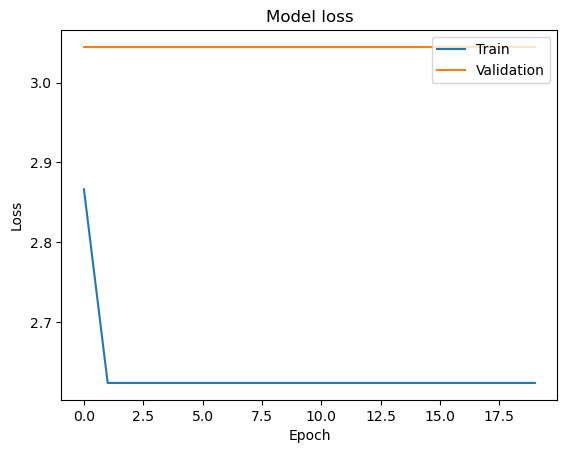

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Using Data Augmentation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Function to preprocess the data
def load_and_preprocess_image(image_name):
    img = tf.keras.preprocessing.image.load_img(f'{training_image_dir}/{image_name}', target_size=(128, 128))
    img = tf.keras.preprocessing.image.img_to_array(img)
    img = img / 255.0
    return img

X = np.array([load_and_preprocess_image(img) for img in df1['image']])
y = df1[['xmin', 'ymin', 'xmax', 'ymax']].values

# Train-test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Data augmentation
datagen = ImageDataGenerator(rotation_range=20,width_shift_range=0.2, height_shift_range=0.2,shear_range=0.2,zoom_range=0.2,horizontal_flip=True,fill_mode='nearest')

datagen.fit(X_train)

# Model definition
model = Sequential([
    tf.keras.Input(shape=(128, 128, 3)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(4)
])

model.compile(optimizer='adam', loss='mse', metrics=['mae', tf.keras.metrics.Precision(name='precision')])

# Train the model with augmented data
history = model.fit(datagen.flow(X_train, y_train, batch_size=32),epochs=20,validation_data=(X_test, y_test),
    steps_per_epoch=len(X_train) // 32)

# Evaluation
train_loss = history.history['loss'][-1]
train_mae = history.history['mae'][-1]
train_precision = history.history['precision'][-1]
val_loss = history.history['val_loss'][-1]
val_mae = history.history['val_mae'][-1]
val_precision = history.history['val_precision'][-1]

print(f"Training Loss (MSE): {train_loss:.4f}")
print(f"Training MAE: {train_mae:.4f}")
print(f"Training Precision: {train_precision:.4f}")
print(f"Validation Loss (MSE): {val_loss:.4f}")
print(f"Validation MAE: {val_mae:.4f}")
print(f"Validation Precision: {val_precision:.4f}")

Epoch 1/20


C:\Users\jeets\anaconda3\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - loss: 78004.5547 - mae: 227.9311 - precision: 0.9011 - val_loss: 28705.5000 - val_mae: 114.7416 - val_precision: 0.9799
Epoch 2/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 26351.9160 - mae: 116.8486 - precision: 0.9597 - val_loss: 28693.3398 - val_mae: 119.2963 - val_precision: 0.9799
Epoch 3/20


C:\Users\jeets\anaconda3\lib\contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 28718.8320 - mae: 124.6172 - precision: 0.9675 - val_loss: 22432.5566 - val_mae: 103.2902 - val_precision: 0.9799
Epoch 4/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 28154.4824 - mae: 126.7684 - precision: 0.9688 - val_loss: 22087.8945 - val_mae: 100.6336 - val_precision: 0.9799
Epoch 5/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 141ms/step - loss: 24721.9961 - mae: 113.3832 - precision: 0.9676 - val_loss: 21627.8652 - val_mae: 107.5077 - val_precision: 0.9799
Epoch 6/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 22769.8320 - mae: 105.8998 - precision: 0.9844 - val_loss: 22024.7832 - val_mae: 112.2228 - val_precision: 0.9799
Epoch 7/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 201ms/step - loss: 23747.3535 - mae: 110.5382 - precision: 0.9679 - val_loss: 20677.8262 - val_mae: 98.5049 - val_precision: 0.9799
Epoch 8/20
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - loss: 26051.3008 - mae: 113.9056 - precision: 0.9844 - val_loss: 20918.0820 - val_mae: 101.

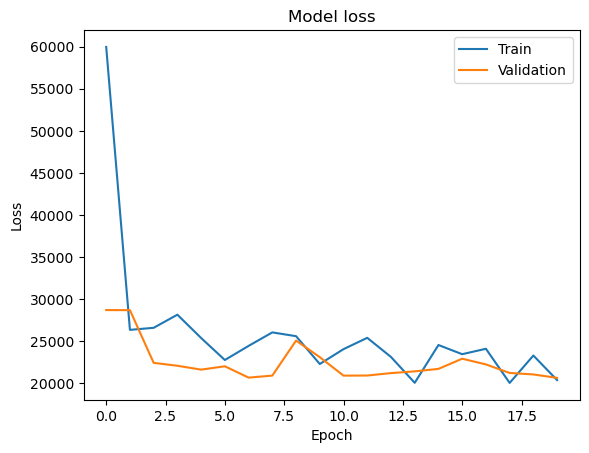

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Using Learning Rate Scheduler

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Model definition
model = Sequential([
    tf.keras.Input(shape=(128, 128, 3)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(4)
])

model.compile(optimizer='adam', loss='mse', metrics=['mae', tf.keras.metrics.Precision(name='precision')])

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    min_lr=1e-6
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[reduce_lr]
)

# Evaluation
train_loss = history.history['loss'][-1]
train_mae = history.history['mae'][-1]
train_precision = history.history['precision'][-1]
val_loss = history.history['val_loss'][-1]
val_mae = history.history['val_mae'][-1]
val_precision = history.history['val_precision'][-1]

print(f"Training Loss (MSE): {train_loss:.4f}")
print(f"Training MAE: {train_mae:.4f}")
print(f"Training Precision: {train_precision:.4f}")
print(f"Validation Loss (MSE): {val_loss:.4f}")
print(f"Validation MAE: {val_mae:.4f}")
print(f"Validation Precision: {val_precision:.4f}")

Epoch 1/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 130ms/step - loss: 76798.7344 - mae: 228.1419 - precision: 0.9038 - val_loss: 22299.8477 - val_mae: 98.5085 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - loss: 26115.9141 - mae: 120.6079 - precision: 0.9697 - val_loss: 23898.8145 - val_mae: 105.1299 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 128ms/step - loss: 25782.1445 - mae: 114.3320 - precision: 0.9688 - val_loss: 21795.0508 - val_mae: 99.3275 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - loss: 23072.5195 - mae: 104.8291 - precision: 0.9709 - val_loss: 22730.3262 - val_mae: 98.9036 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 5/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 145ms/step - loss: 22700.8711 - mae: 103.4914 - precision: 0.9715 - val_loss: 19984.4199 - val_mae: 95.8750 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 6/20
14/

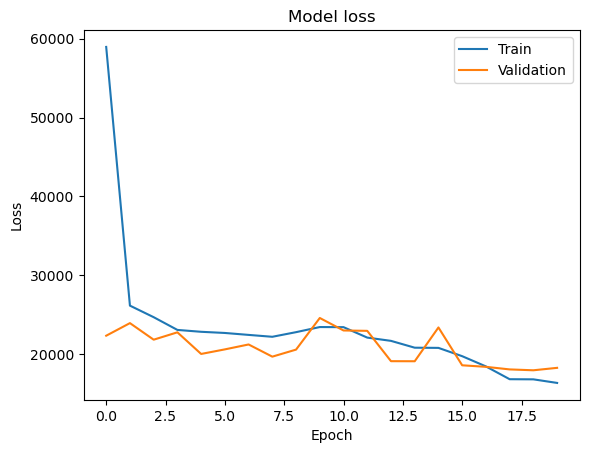

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Increased Hidden layer

In [ ]:
# Model definition with increased hidden layers
model = Sequential([
    tf.keras.Input(shape=(128, 128, 3)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dense(4)
])

model.compile(optimizer='adam', loss='mse', metrics=['mae', tf.keras.metrics.Precision(name='precision')])

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=5,
    min_lr=1e-6
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[reduce_lr]
)

# Evaluation
train_loss = history.history['loss'][-1]
train_mae = history.history['mae'][-1]
train_precision = history.history['precision'][-1]
val_loss = history.history['val_loss'][-1]
val_mae = history.history['val_mae'][-1]
val_precision = history.history['val_precision'][-1]

print(f"Training Loss (MSE): {train_loss:.4f}")
print(f"Training MAE: {train_mae:.4f}")
print(f"Training Precision: {train_precision:.4f}")
print(f"Validation Loss (MSE): {val_loss:.4f}")
print(f"Validation MAE: {val_mae:.4f}")
print(f"Validation Precision: {val_precision:.4f}")

Epoch 1/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 144ms/step - loss: 78667.5234 - mae: 231.9020 - precision: 0.9008 - val_loss: 35384.2422 - val_mae: 140.1360 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 135ms/step - loss: 32451.2949 - mae: 137.8445 - precision: 0.9722 - val_loss: 25248.3945 - val_mae: 107.0329 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 144ms/step - loss: 30751.2949 - mae: 130.8527 - precision: 0.9709 - val_loss: 21031.8867 - val_mae: 99.7362 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 28114.2539 - mae: 122.9750 - precision: 0.9706 - val_loss: 27144.2305 - val_mae: 118.8691 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 5/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - loss: 29357.2402 - mae: 124.4795 - precision: 0.9703 - val_loss: 27653.2949 - val_mae: 119.3711 - val_precision: 0.9799 - learning_rate: 0.0010
Epoch 6/20


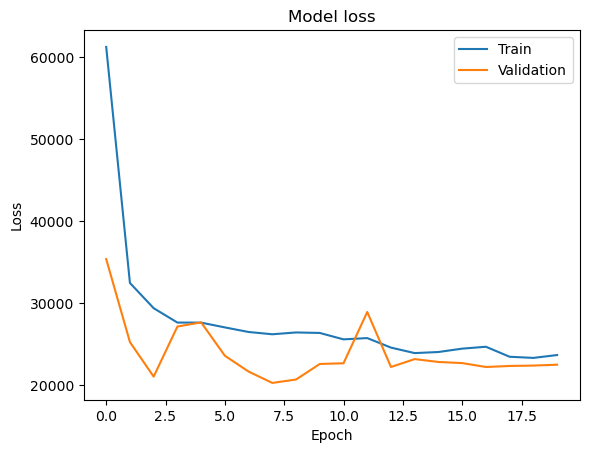

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

| Model Number | Training Loss(MSE) | Training MAE | Training Precision | Validation Loss(MSE) | Validation MAE | Validation Precision |
|:---------:|:--------:|:---------:|:---------:|:---------:|:---------:|:---------:|
|  Model 1  | 2.6242   | 1.1814   | 0.9692   | 3.0446  | 1.2962 | 0.9799 |
|  Model 2  |  20381.8027  |  96.8078  |  0.9609  |  20647.95 | 100.1070 | 0.9799 |
|  Model 3  |  16305.95  |  83.9299  |  0.9692  |  18220.0020 | 84.3409 | 0.9799 |
|  Model 4  |  23666.9062  |  110.5713 | 0.9692 | 22488.1719 | 102.8278 | 0.9799 |

&rarr; Model 1: This model has the lowest training loss and validation loss, which suggests that it performs the best in terms of minimizing errors on both training and validation data. It also has a relatively low MAE and high precision for both training and validation, indicating good performance.

&rarr; Model 2, Model 3, Model 4: These models have significantly higher training loss, validation loss, and MAE compared to Model 1. While their precision values are the same as Model 1, their poor performance in terms of loss and MAE suggests that they are overfitting or not generalizing well to unseen data.

&rarr; Based on the results, Model 1 appears to be the best-performing model in terms of both training and validation performance. It has the lowest loss, lowest MAE, and high precision values compared to the other models. Therefore, Model 1 would likely be the preferred choice for our case.